In [89]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import decode_predictions
from keras.applications.vgg16 import VGG16
from keras import models
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.colors import LinearSegmentedColormap
# load the model
model = VGG16()
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [78]:
# load an image from file
image = load_img('House_lake.png', target_size=(224, 224))
# convert the image pixels to a numpy array
image = img_to_array(image)
# print(image)
# reshape data for the model
# print(image.shape, np.vstack([np.expand_dims(image, axis=0)]).shape)
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
# prepare the image for the VGG model
image = preprocess_input(image)
# predict the probability across all output classes
yhat = model.predict(image)
# convert the probabilities to class labels
label = decode_predictions(yhat)
# retrieve the most likely result, e.g. highest probability
label = label[0][0]
# print the classification
print('%s (%.2f%%)' % (label[1], label[2]*100))

(224, 224, 3) (1, 224, 224, 3)
coffee_mug (70.11%)


In [2]:
img_tensor = load_img('River.png', target_size=(224, 224))
img_tensor = img_to_array(img_tensor)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

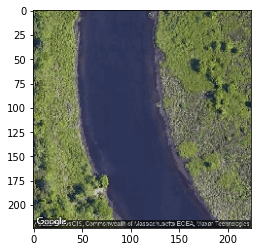

(1, 224, 224, 3)


In [3]:
plt.imshow(img_tensor[0])
plt.show()
print(img_tensor.shape)

In [60]:
layer_outputs = [layer.output for layer in model.layers[:12]] # Extracts the outputs of the top 7 layers
activation_model = models.Model(inputs=model.input, outputs=layer_outputs) # Creates a model that will
# return these outputs, given the model input

In [61]:
activations = activation_model.predict(img_tensor) # Returns a list of five Numpy arrays: one array per layer activation

In [77]:
layer_activation = activations[9]
print(layer_activation.shape)

(1, 56, 56, 256)


In [72]:
len(activations)

12

In [79]:
colorsr = [(0, 0, 0), (1, 0, 0)] # first color is black, last is red
cmap_red = LinearSegmentedColormap.from_list("Custom", colorsr, N=20)
colorsg = [(0, 0, 0), (0, 1, 0)] # first color is black, last is green
cmap_green = LinearSegmentedColormap.from_list("Custom", colorsg, N=20)
colorsb = [(0, 0, 0), (0, 0, 1)] # first color is black, last is green
cmap_blue = LinearSegmentedColormap.from_list("Custom", colorsb, N=20)

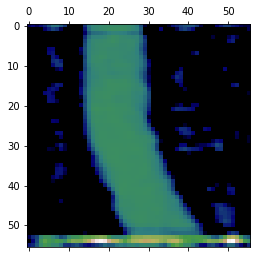

In [79]:
plt.matshow(layer_activation[0, :, :,209], cmap='gist_earth')

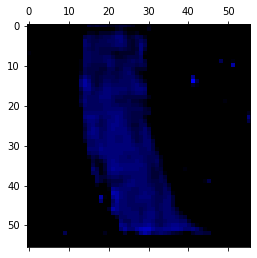

In [92]:
colors = [(0, 0, 0), (0, 0, 1)] # first color is black, last is red
cmap = LinearSegmentedColormap.from_list("Custom", colors, N=20)
#cmap = matplotlib.colors.ListedColormap(['black','cornflowerblue'])
plt.matshow(layer_activation[0, :, :,218], cmap=cmap)

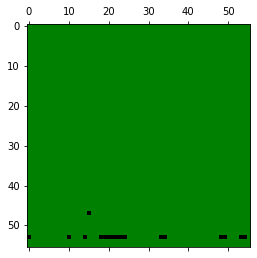

In [85]:
# Color for False and True
cmap = matplotlib.colors.ListedColormap(['green','black'])
plt.matshow(layer_activation[0, :, :,21], cmap=cmap)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


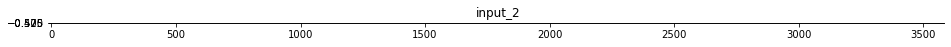

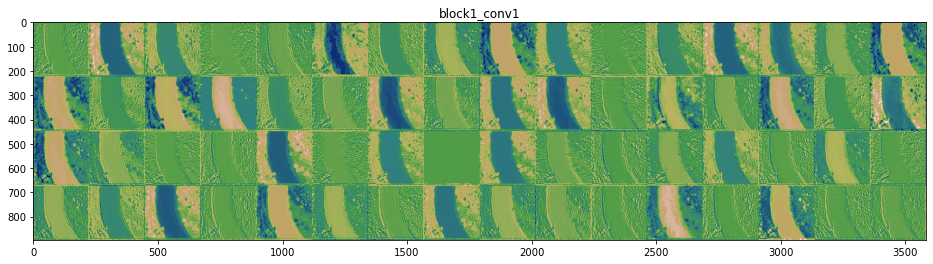

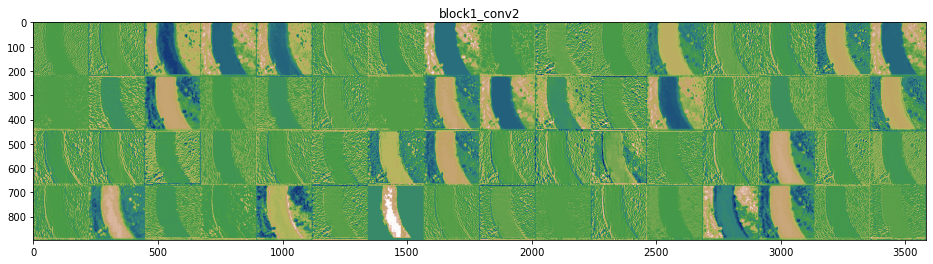

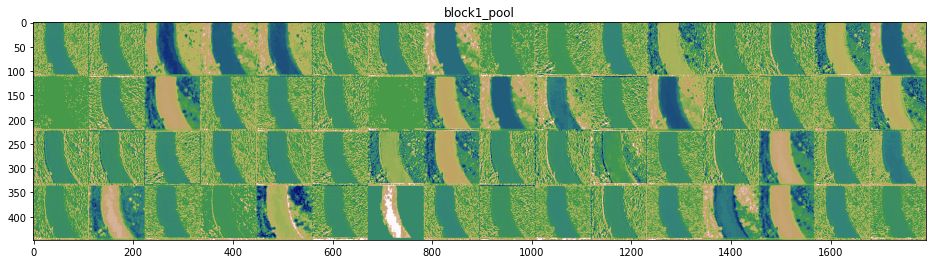

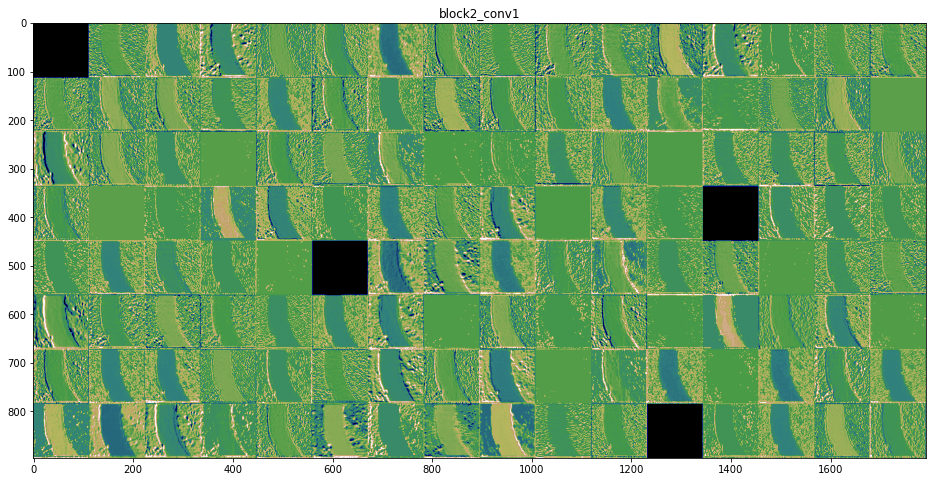

...

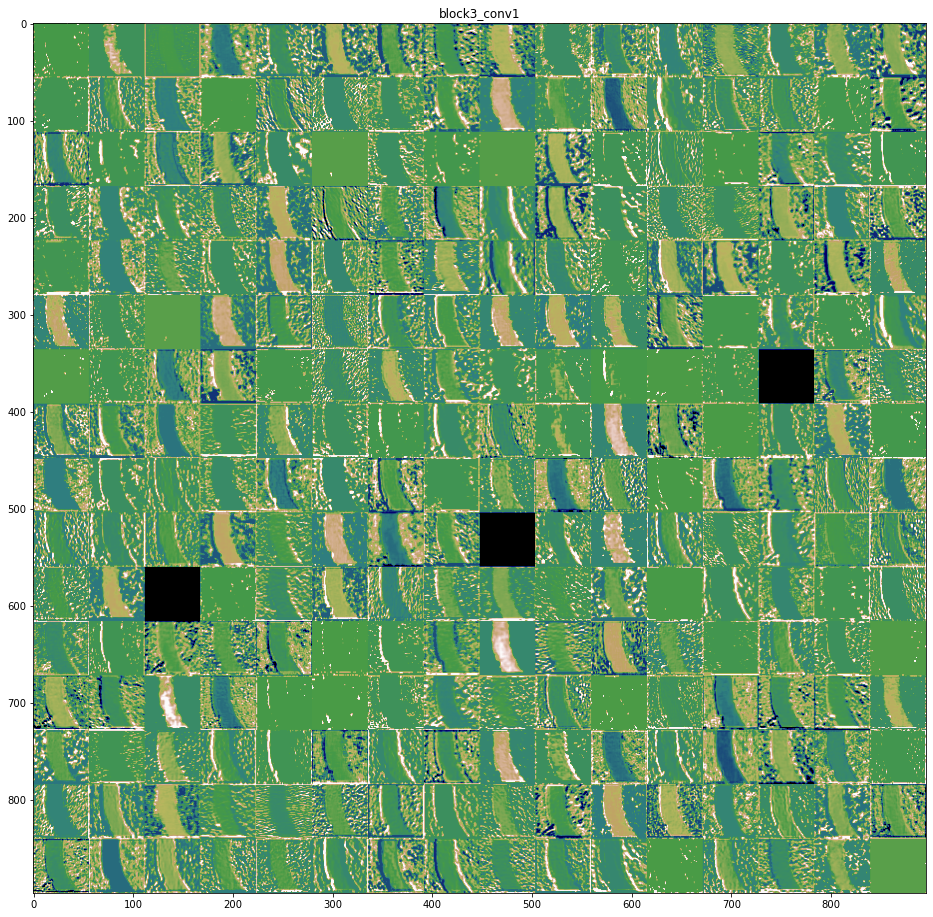

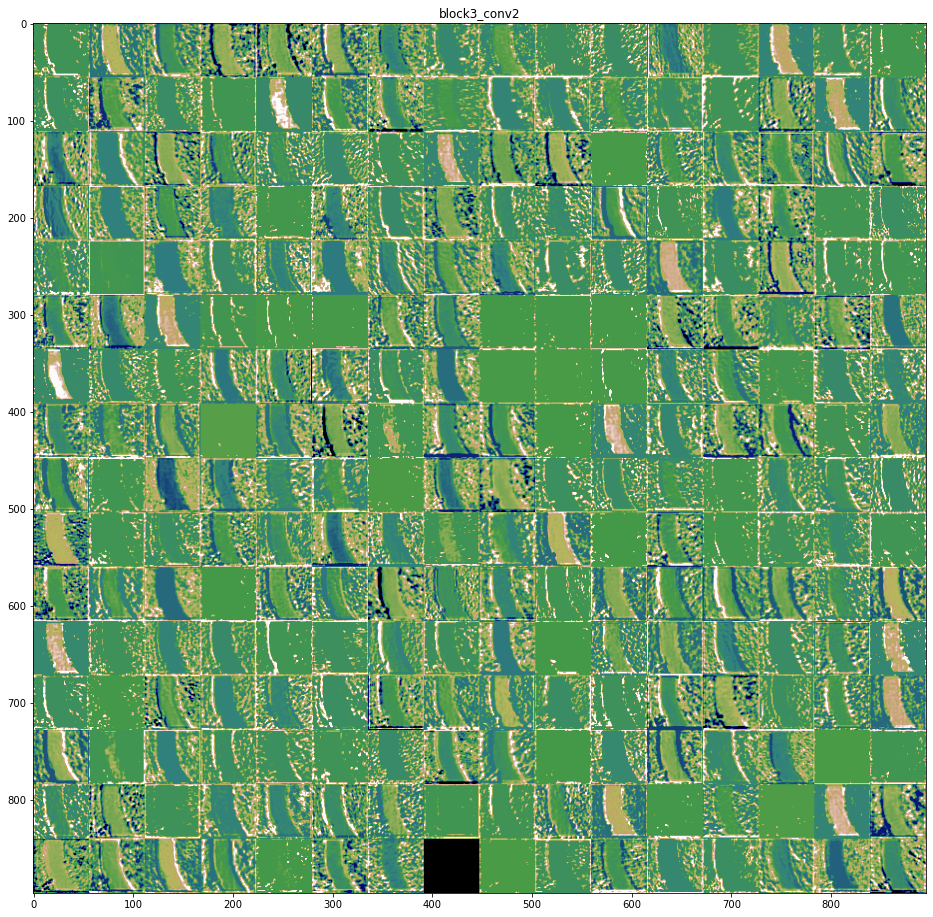

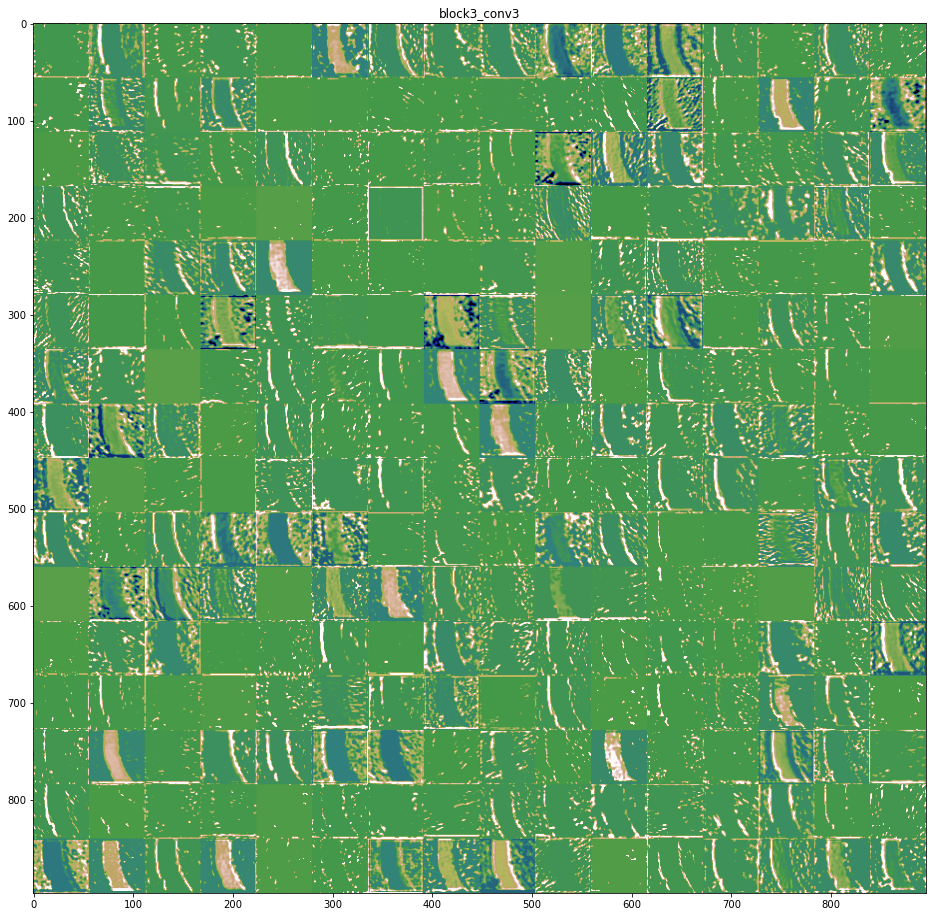

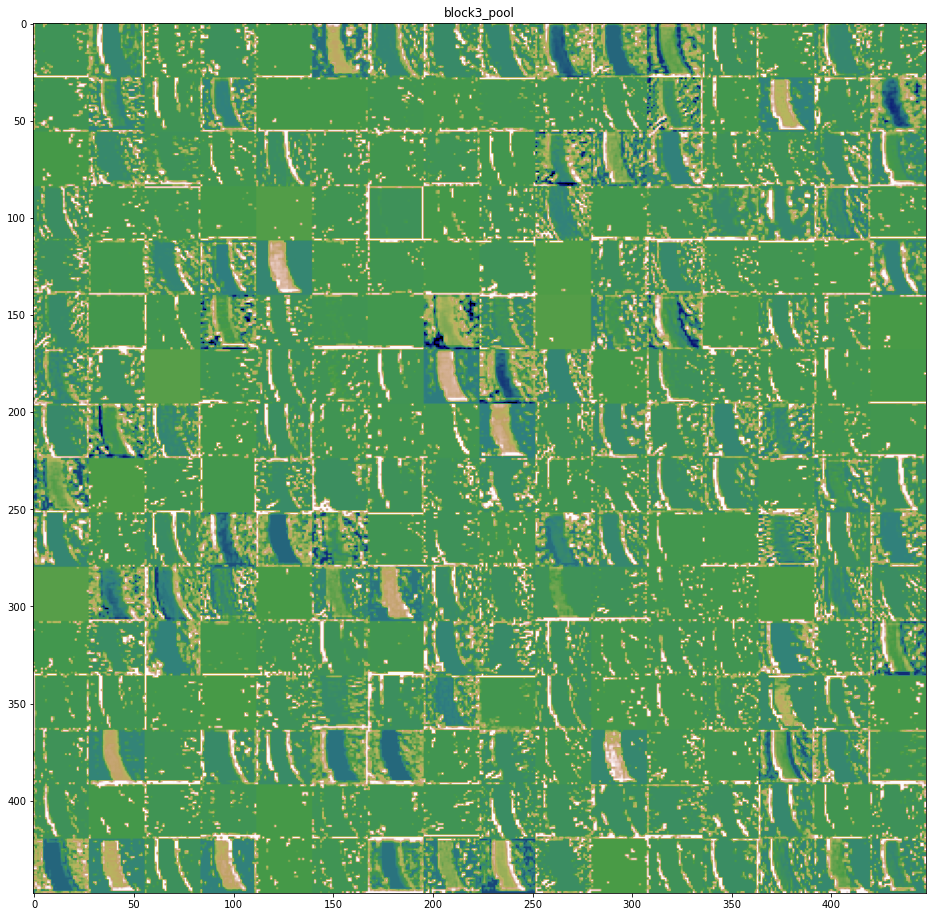

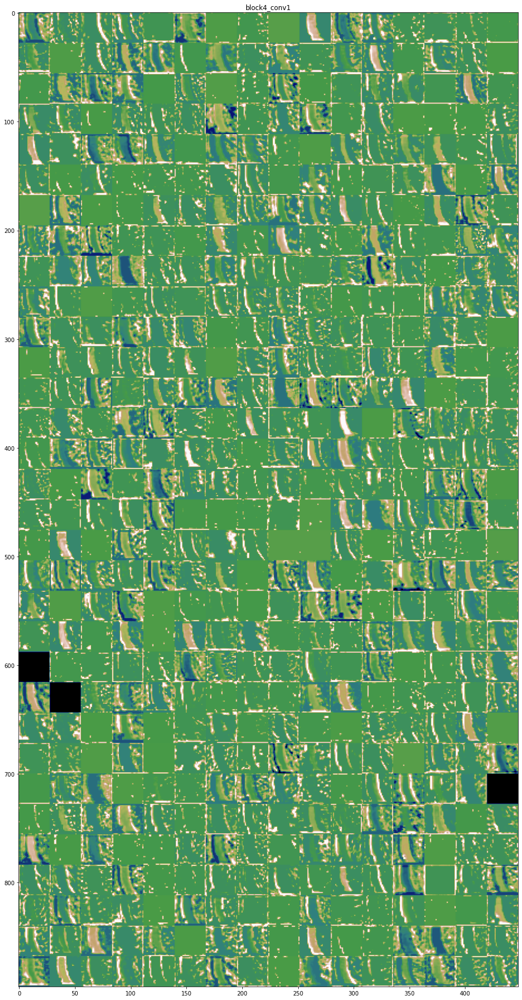

In [68]:
layer_names = []
for layer in model.layers[:19]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
    
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='gist_earth')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.


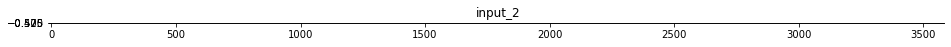

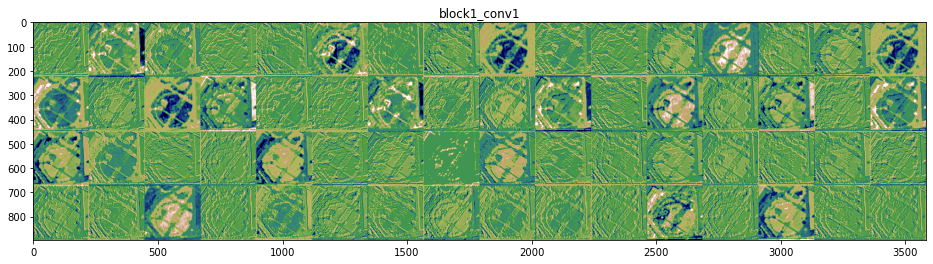

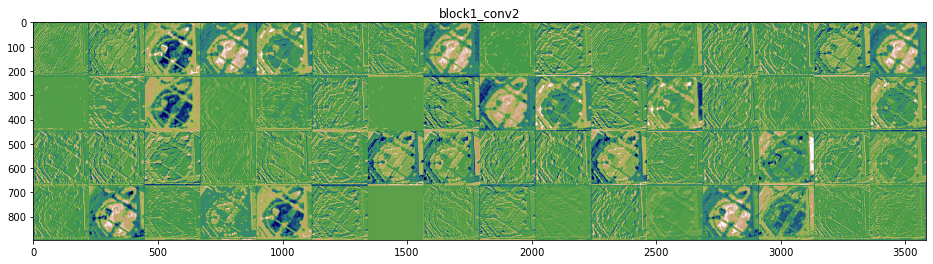

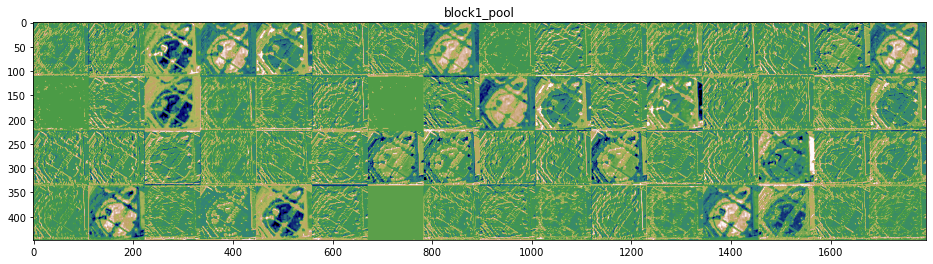

In [60]:
layer_names = []
for layer in model.layers[:4]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
    
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='gist_earth')